In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression


In [18]:
df=pd.read_csv('C:\\Users\\macou\\OneDrive\\Desktop\\Python Projetcs\\cbb.csv')

In [19]:
df

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,30.4,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016
1,Villanova,BE,40,35,123.1,90.9,0.9703,56.1,46.7,16.3,...,30.0,57.4,44.1,36.2,33.9,66.7,8.9,Champions,2.0,2016
2,Notre Dame,ACC,36,24,118.3,103.3,0.8269,54.0,49.5,15.3,...,26.0,52.9,46.5,37.4,36.9,65.5,2.3,E8,6.0,2016
3,Virginia,ACC,37,29,119.9,91.0,0.9600,54.8,48.4,15.1,...,33.4,52.6,46.3,40.3,34.7,61.9,8.6,E8,1.0,2016
4,Kansas,B12,37,32,120.9,90.4,0.9662,55.7,45.1,17.8,...,37.3,52.7,43.4,41.3,32.5,70.1,11.6,E8,1.0,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401,Houston,Amer,37,33,115.7,90.5,0.9439,52.1,42.5,16.5,...,37.3,51.3,43.0,35.5,27.9,67.3,7.8,S16,3.0,2019
1402,Michigan,B10,37,30,114.6,85.6,0.9665,51.6,44.1,13.9,...,24.1,51.8,44.3,34.2,29.1,65.9,9.2,S16,2.0,2019
1403,Oregon,P12,38,25,108.1,91.7,0.8687,52.0,46.4,17.8,...,33.9,51.6,48.8,35.1,29.0,65.4,-1.1,S16,12.0,2019
1404,LSU,SEC,35,28,117.9,96.6,0.9081,51.2,49.9,17.9,...,33.1,52.9,49.4,31.9,33.7,71.2,7.3,S16,3.0,2019


In [20]:
df.isnull().sum()

TEAM             0
CONF             0
G                0
W                0
ADJOE            0
ADJDE            0
BARTHAG          0
EFG_O            0
EFG_D            0
TOR              0
TORD             0
ORB              0
DRB              0
FTR              0
FTRD             0
2P_O             0
2P_D             0
3P_O             0
3P_D             0
ADJ_T            0
WAB              0
POSTSEASON    1134
SEED          1134
YEAR             0
dtype: int64

In [21]:
df.describe()

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,...,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,YEAR
count,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,...,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,1406.000000,272.000000,1406.000000
mean,31.570413,16.724751,103.848720,103.849716,0.493272,50.406757,50.595448,18.458535,18.391821,28.881223,...,34.612233,34.885633,49.486415,49.642745,34.662873,34.830228,69.292461,-7.855121,8.790441,2017.502134
std,2.586927,6.492069,7.250998,6.422037,0.255095,3.042034,2.779066,1.949515,2.082490,4.045938,...,4.798377,5.735014,3.366320,3.211512,2.670789,2.333992,2.771836,7.001387,4.676650,1.119066
min,24.000000,1.000000,82.900000,85.200000,0.026600,40.000000,41.100000,13.500000,10.200000,15.000000,...,21.600000,21.800000,37.700000,38.400000,26.700000,27.500000,60.300000,-25.200000,1.000000,2016.000000
25%,30.000000,12.000000,98.900000,99.225000,0.281400,48.400000,48.800000,17.200000,17.000000,26.200000,...,31.300000,30.700000,47.200000,47.525000,32.800000,33.200000,67.400000,-13.100000,5.000000,2017.000000
50%,31.000000,16.000000,103.400000,104.000000,0.474000,50.400000,50.600000,18.400000,18.300000,29.000000,...,34.500000,34.300000,49.400000,49.600000,34.600000,34.800000,69.200000,-8.450000,9.000000,2018.000000
75%,33.000000,21.000000,108.300000,108.275000,0.711075,52.400000,52.400000,19.700000,19.700000,31.600000,...,37.800000,38.700000,51.600000,51.775000,36.500000,36.400000,71.000000,-3.100000,13.000000,2019.000000
max,40.000000,37.000000,128.400000,124.000000,0.974400,59.800000,59.500000,25.900000,27.600000,42.000000,...,49.400000,58.500000,62.600000,61.200000,43.400000,43.100000,83.400000,11.600000,16.000000,2019.000000


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1406 entries, 0 to 1405
Data columns (total 24 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   TEAM        1406 non-null   object 
 1   CONF        1406 non-null   object 
 2   G           1406 non-null   int64  
 3   W           1406 non-null   int64  
 4   ADJOE       1406 non-null   float64
 5   ADJDE       1406 non-null   float64
 6   BARTHAG     1406 non-null   float64
 7   EFG_O       1406 non-null   float64
 8   EFG_D       1406 non-null   float64
 9   TOR         1406 non-null   float64
 10  TORD        1406 non-null   float64
 11  ORB         1406 non-null   float64
 12  DRB         1406 non-null   float64
 13  FTR         1406 non-null   float64
 14  FTRD        1406 non-null   float64
 15  2P_O        1406 non-null   float64
 16  2P_D        1406 non-null   float64
 17  3P_O        1406 non-null   float64
 18  3P_D        1406 non-null   float64
 19  ADJ_T       1406 non-null  

In [23]:
df.columns

Index(['TEAM', 'CONF', 'G', 'W', 'ADJOE', 'ADJDE', 'BARTHAG', 'EFG_O', 'EFG_D',
       'TOR', 'TORD', 'ORB', 'DRB', 'FTR', 'FTRD', '2P_O', '2P_D', '3P_O',
       '3P_D', 'ADJ_T', 'WAB', 'POSTSEASON', 'SEED', 'YEAR'],
      dtype='object')

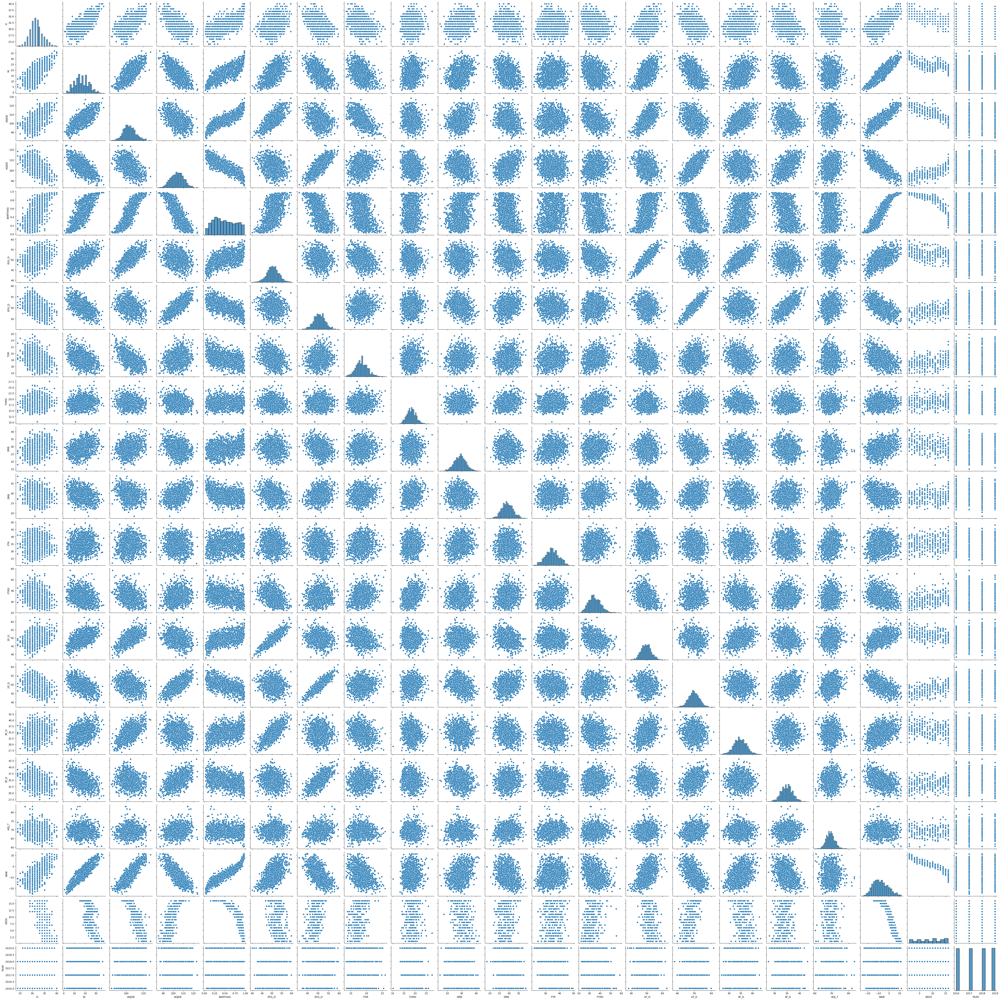

In [24]:
sns.pairplot(df, height=2.7)

<Axes: >

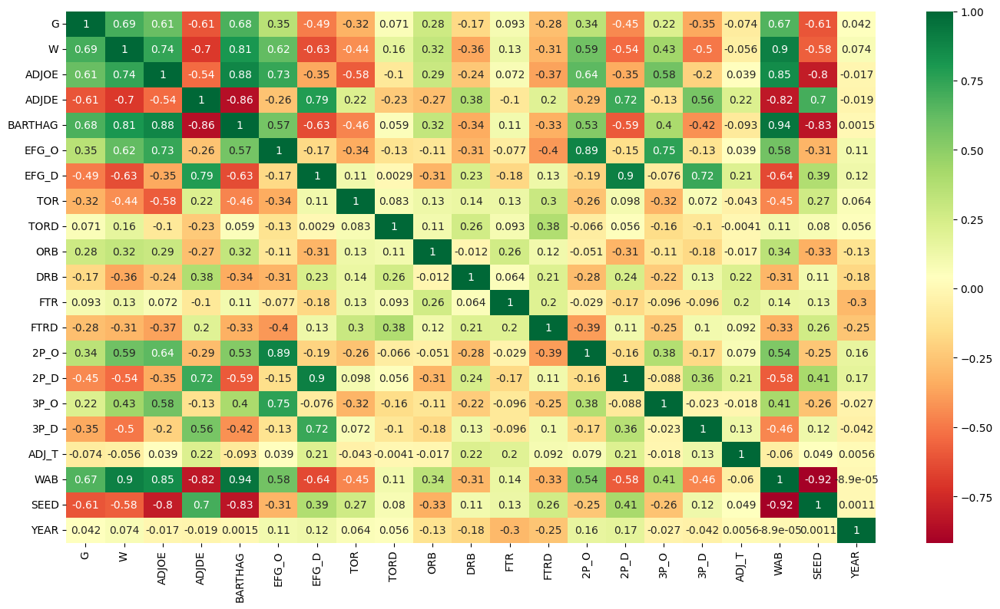

In [25]:
df_numeric = df.select_dtypes(include='number')
plt.figure(figsize=(17, 9))
sns.heatmap(df_numeric.corr(), annot=True, cmap="RdYlGn")

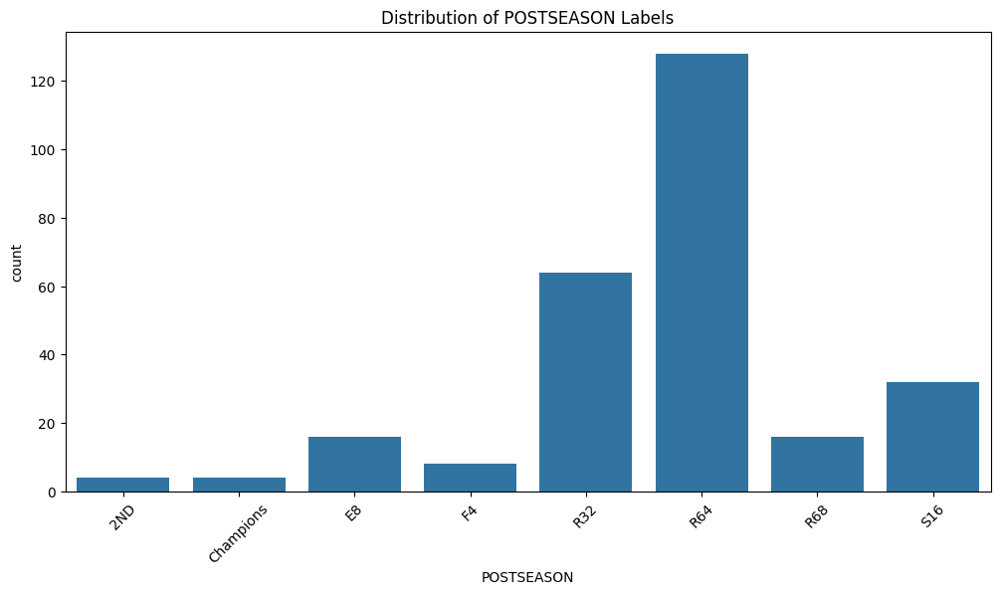

In [26]:
# Check target distribution
plt.figure(figsize=(12,6))
sns.countplot(x='POSTSEASON', data=data)
plt.xticks(rotation=45)
plt.title('Distribution of POSTSEASON Labels')
plt.show()

In [27]:
# Drop rows where POSTSEASON is missing
data = df.dropna(subset=['POSTSEASON'])


In [29]:
# Separate features and labels
X = df.drop(['POSTSEASON', 'TEAM'], axis=1)
y = df['POSTSEASON']

# Encode target labels (y)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

# Encode categorical features in X
categorical_cols = X.select_dtypes(include=['object']).columns

for col in categorical_cols:
    X[col] = le.fit_transform(X[col])

# Handle missing values (IMPORTANT step)
X = X.fillna(X.mean())

# Normalize features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Now X_normalized is 100% clean: no NaNs, no strings

# Continue with model training...
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y, test_size=0.2, random_state=42)

# Train and evaluate modelss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

models = {
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC()
}

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc

print(results)

{'KNN': 0.8439716312056738, 'Decision Tree': 0.875886524822695, 'Logistic Regression': 0.8439716312056738, 'SVM': 0.8617021276595744}


In [30]:
# Sort results by accuracy
sorted_results = dict(sorted(results.items(), key=lambda item: item[1], reverse=True))

print("Model Ranking based on Accuracy:")
for rank, (model, accuracy) in enumerate(sorted_results. items(), 1):
    print(f"{rank}. {model} - Accuracy: {accuracy:.4f}")

Model Ranking based on Accuracy:
1. Decision Tree - Accuracy: 0.8759
2. SVM - Accuracy: 0.8617
3. KNN - Accuracy: 0.8440
4. Logistic Regression - Accuracy: 0.8440
